# Variational Autoencoder (VAE) Tutorial with PyTorch

## Welcome to this Comprehensive VAE Tutorial!

Hello! This Jupyter notebook provides a detailed, student-friendly introduction to Variational Autoencoders (VAEs), one of the most important generative models in deep learning. This tutorial is designed to complement the DCGAN tutorial and provide a probabilistic perspective on generative modeling.

This tutorial assumes you have basic knowledge of Python, PyTorch, probability theory, and neural networks. If you're new to autoencoders, consider reviewing basic autoencoder concepts first.

### What You'll Learn
- The probabilistic foundations of VAEs and how they differ from GANs
- Mathematical derivation of the VAE loss function (ELBO)
- The reparameterization trick and why it's crucial
- Encoder-decoder architecture for image generation
- Hands-on implementation using PyTorch on the CIFAR-10 dataset
- Latent space exploration and interpolation
- Training tips and visualization techniques

### Prerequisites
- **PyTorch**: Modern version (1.8.0+)
- **Hardware**: GPU recommended (use Google Colab if needed)
- **Libraries**: `torch`, `torchvision`, `matplotlib`, `numpy`, `scipy`
- Install with: `pip install torch torchvision matplotlib numpy scipy`

### Notebook Structure
1. **Introduction**: What are VAEs and why use them?
2. **Mathematical Foundations**: ELBO, KL divergence, reparameterization trick
3. **Architecture Deep Dive**: Encoder and Decoder designs
4. **Implementation**: Code for models and training
5. **Training and Evaluation**: Run the training loop and visualize results
6. **Latent Space Exploration**: Interpolation and generation
7. **Exercises**: Try it yourself!

Run cells sequentially (Shift+Enter). Let's dive into the probabilistic world of VAEs! 🎲

## 1. Introduction: What are Variational Autoencoders?

### VAE vs Traditional Autoencoders

**Traditional Autoencoders**:
- Learn a deterministic mapping: $x \rightarrow z \rightarrow \hat{x}$
- Latent code $z$ is a fixed vector for each input
- Good for compression and denoising, but poor for generation
- Problem: Latent space has "holes" - sampling random $z$ gives bad results

**Variational Autoencoders**:
- Learn a probabilistic mapping: $x \rightarrow p(z|x) \rightarrow p(x|z)$
- Latent code $z$ is sampled from a learned distribution
- Designed for generation - can sample new data from latent space
- Enforces smooth, continuous latent space through regularization

### VAE vs GANs

| Aspect | VAE | GAN |
|--------|-----|-----|
| Training | Single network (encoder+decoder) | Two competing networks |
| Loss Function | Reconstruction + KL divergence | Adversarial minimax game |
| Stability | More stable training | Can suffer from mode collapse |
| Output Quality | Slightly blurrier images | Sharper, more realistic images |
| Latent Space | Well-structured, interpretable | Less interpretable |
| Use Cases | Generation, interpolation, anomaly detection | High-quality image synthesis |

### Key Papers
- **Original VAE Paper**: [Auto-Encoding Variational Bayes](https://arxiv.org/abs/1312.6114) (Kingma & Welling, 2013)
- **Tutorial**: [Tutorial on Variational Autoencoders](https://arxiv.org/abs/1606.05908) (Doersch, 2016)

### Our Dataset: CIFAR-10
- 60,000 32×32 RGB images across 10 classes
- Small enough for quick training, complex enough to be interesting
- We'll train the VAE to generate new CIFAR-10-like images

## 2. Mathematical Foundations

### 2.1 The Generative Model

VAEs are **latent variable models**. We assume:
1. There exists a latent variable $z$ (e.g., object type, color, pose)
2. Data $x$ is generated from $z$ via a probability distribution $p_\theta(x|z)$
3. The prior over $z$ is simple: $p(z) = \mathcal{N}(0, I)$ (standard normal)

**Generative Process**:
```
1. Sample z ~ N(0, I)
2. Generate x ~ p_θ(x|z)  [decoder network]
```

**Goal**: Learn $\theta$ (decoder parameters) to maximize $p_\theta(x)$ for real data $x$.

### 2.2 The Inference Problem

We want to compute the **marginal likelihood**:
$$p_\theta(x) = \int p_\theta(x|z) p(z) \, dz$$

**Problem**: This integral is intractable! We can't compute it directly.

**Solution**: Introduce an **approximate posterior** $q_\phi(z|x)$ (encoder network) that approximates the true posterior $p_\theta(z|x)$.

### 2.3 Evidence Lower Bound (ELBO)

Using **variational inference**, we can derive the ELBO:

$$\log p_\theta(x) = \mathbb{E}_{q_\phi(z|x)} \left[ \log p_\theta(x|z) \right] - D_{KL}(q_\phi(z|x) \| p(z)) + D_{KL}(q_\phi(z|x) \| p_\theta(z|x))$$

Since $D_{KL} \geq 0$, we get the **lower bound**:

$$\log p_\theta(x) \geq \underbrace{\mathbb{E}_{q_\phi(z|x)} \left[ \log p_\theta(x|z) \right]}_{\text{Reconstruction term}} - \underbrace{D_{KL}(q_\phi(z|x) \| p(z))}_{\text{Regularization term}}$$

The right side is the **ELBO** (Evidence Lower BOund), denoted $\mathcal{L}(\theta, \phi; x)$.

### 2.4 VAE Loss Function

We **maximize the ELBO**, which is equivalent to **minimizing**:

$$\boxed{\mathcal{L}_{\text{VAE}} = \underbrace{-\mathbb{E}_{q_\phi(z|x)} \left[ \log p_\theta(x|z) \right]}_{\text{Reconstruction Loss}} + \underbrace{D_{KL}(q_\phi(z|x) \| p(z))}_{\text{KL Divergence}}}$$

**Interpretation**:
- **Reconstruction Loss**: Forces the decoder to reconstruct the input from the latent code
  - For images: Binary Cross-Entropy (BCE) or Mean Squared Error (MSE)
  - $-\log p_\theta(x|z) \approx \|x - \hat{x}\|^2$ (MSE) or BCE$(x, \hat{x})$
  
- **KL Divergence**: Regularizes the latent space to follow the prior $\mathcal{N}(0, I)$
  - Prevents the encoder from "cheating" (encoding to arbitrary values)
  - Ensures smooth, continuous latent space for generation

### 2.5 Gaussian VAE (Closed-Form KL)

If we choose $q_\phi(z|x) = \mathcal{N}(z; \mu_\phi(x), \sigma^2_\phi(x) I)$, the KL divergence has a **closed form**:

$$D_{KL}(q_\phi(z|x) \| \mathcal{N}(0, I)) = \frac{1}{2} \sum_{j=1}^{J} \left( \sigma_j^2 + \mu_j^2 - \log \sigma_j^2 - 1 \right)$$

where $J$ is the latent dimension.

**In code** (for numerical stability, we output $\log \sigma^2$ instead of $\sigma^2$):
```python
kl_loss = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
```

### 2.6 The Reparameterization Trick

**Problem**: We need to backpropagate through $z \sim q_\phi(z|x)$, but sampling is **not differentiable**!

**Solution**: Reparameterize $z$ to separate randomness from parameters:

$$z = \mu_\phi(x) + \sigma_\phi(x) \odot \epsilon, \quad \epsilon \sim \mathcal{N}(0, I)$$

Now:
- $\epsilon$ is random (non-differentiable), but has no parameters
- $\mu_\phi(x)$ and $\sigma_\phi(x)$ are differentiable w.r.t. $\phi$
- Gradients flow through $\mu$ and $\sigma$, not through $\epsilon$

**In code**:
```python
std = torch.exp(0.5 * log_var)  # σ = exp(0.5 * log σ²)
eps = torch.randn_like(std)      # ε ~ N(0, I)
z = mu + eps * std               # z = μ + ε · σ
```

### Visual Summary

```
┌─────────────────────────────────────────────────────────────┐
│                    VAE Architecture                         │
│                                                             │
│  Input x  →  Encoder  →  μ(x), σ²(x)                       │
│                              ↓                              │
│                         z = μ + ε·σ  (reparameterization)   │
│                              ↓                              │
│                          Decoder  →  x̂                      │
│                                                             │
│  Loss = ||x - x̂||² + KL(q(z|x) || p(z))                    │
└─────────────────────────────────────────────────────────────┘
```

## 3. Architecture Deep Dive

### 3.1 Encoder Network

**Purpose**: Map input $x$ to latent distribution parameters $\mu(x)$ and $\log \sigma^2(x)$

**Architecture**:
- **Input**: 3×32×32 RGB image (CIFAR-10)
- **Layers**: Convolutional layers with BatchNorm + ReLU
- **Output**: Two vectors of dimension $d_z$ (latent dimension)
  - $\mu$: Mean of latent distribution
  - $\log \sigma^2$: Log-variance (for numerical stability)

```
x (3×32×32) → Conv(64) → Conv(128) → Conv(256) → Flatten
                                                     ↓
                                        ┌────────────┴────────────┐
                                        ↓                         ↓
                                    FC → μ (dz)              FC → log σ² (dz)
```

### 3.2 Decoder Network

**Purpose**: Map latent code $z$ to reconstructed image $\hat{x}$

**Architecture**:
- **Input**: $z$ of dimension $d_z$
- **Layers**: Transposed convolutions (upsampling) with BatchNorm + ReLU
- **Output**: 3×32×32 RGB image
- **Final Activation**: Sigmoid (for BCE loss) or Tanh (for MSE with normalized images)

```
z (dz) → FC → Reshape → TransConv(256) → TransConv(128) → TransConv(64) → TransConv(3) → x̂ (3×32×32)
```

### 3.3 Hyperparameters

| Parameter | Value | Notes |
|-----------|-------|-------|
| Latent Dimension (dz) | 128 | Balance between compression and reconstruction |
| Batch Size | 128 | Standard for CIFAR-10 |
| Learning Rate | 1e-3 | Using Adam optimizer |
| Beta (KL weight) | 1.0 | Can adjust for β-VAE (values < 1 prioritize reconstruction) |
| Image Size | 32×32 | Native CIFAR-10 resolution |
| Epochs | 50 | Adjust based on convergence |

### 3.4 Design Choices

1. **Why log-variance?** 
   - Numerical stability: $\sigma^2$ is always positive, but network outputs can be negative
   - $\sigma^2 = \exp(\log \sigma^2)$ ensures positivity

2. **Why Gaussian latent space?**
   - Closed-form KL divergence
   - Easy to sample from standard normal for generation
   - Works well in practice

3. **Convolutional vs Fully-Connected?**
   - Conv layers preserve spatial structure
   - Fewer parameters than FC for images
   - Better generalization

## 4. Implementation

Let's implement the VAE in PyTorch!

### 4.1 Setup and Imports

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import os

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Hyperparameters
latent_dim = 128      # Dimension of latent space z
hidden_dim = 256      # Hidden layer dimension
image_size = 32       # CIFAR-10 native size
nc = 3                # RGB channels
batch_size = 128
num_epochs = 50
learning_rate = 1e-3
beta = 1.0            # Weight for KL divergence (1.0 = standard VAE)

# Create output directory
os.makedirs("outputs/vae", exist_ok=True)

print("Setup complete!")

Using device: cuda:0
Setup complete!


### 4.2 Encoder Network

The encoder takes an image and outputs the parameters of the latent distribution.

In [2]:
class Encoder(nn.Module):
    def __init__(self, latent_dim=128, nc=3):
        super(Encoder, self).__init__()
        
        # Convolutional layers for feature extraction
        # Input: 3 x 32 x 32
        self.conv1 = nn.Sequential(
            nn.Conv2d(nc, 64, kernel_size=4, stride=2, padding=1),  # 64 x 16 x 16
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 128 x 8 x 8
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 256 x 4 x 4
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        
        # Fully connected layers to latent parameters
        self.fc_mu = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4, latent_dim)
        
    def forward(self, x):
        # Convolutional feature extraction
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        
        # Flatten
        x = x.view(x.size(0), -1)  # Flatten to (batch_size, 256*4*4)
        
        # Get distribution parameters
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        
        return mu, logvar

# Test encoder
encoder = Encoder(latent_dim).to(device)
test_img = torch.randn(1, 3, 32, 32).to(device)
mu, logvar = encoder(test_img)
print(f"Encoder output shapes: mu={mu.shape}, logvar={logvar.shape}")
print(f"Expected: mu=torch.Size([1, {latent_dim}]), logvar=torch.Size([1, {latent_dim}])")

Encoder output shapes: mu=torch.Size([1, 128]), logvar=torch.Size([1, 128])
Expected: mu=torch.Size([1, 128]), logvar=torch.Size([1, 128])


### 4.3 Decoder Network

The decoder takes a latent code and reconstructs the image.

In [3]:
class Decoder(nn.Module):
    def __init__(self, latent_dim=128, nc=3):
        super(Decoder, self).__init__()
        
        # Fully connected layer to expand latent code
        self.fc = nn.Linear(latent_dim, 256 * 4 * 4)
        
        # Transposed convolutional layers for upsampling
        # Input: 256 x 4 x 4 (after reshaping)
        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 128 x 8 x 8
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        
        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 64 x 16 x 16
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(64, nc, kernel_size=4, stride=2, padding=1),  # 3 x 32 x 32
            nn.Sigmoid()  # Output in [0, 1] for BCE loss
        )
        
    def forward(self, z):
        # Expand and reshape
        x = self.fc(z)
        x = x.view(x.size(0), 256, 4, 4)  # Reshape to (batch_size, 256, 4, 4)
        
        # Transposed convolutions
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        
        return x

# Test decoder
decoder = Decoder(latent_dim).to(device)
test_z = torch.randn(1, latent_dim).to(device)
recon = decoder(test_z)
print(f"Decoder output shape: {recon.shape}")
print(f"Expected: torch.Size([1, 3, 32, 32])")

Decoder output shape: torch.Size([1, 3, 32, 32])
Expected: torch.Size([1, 3, 32, 32])


### 4.4 Complete VAE Model

Now we combine encoder and decoder with the reparameterization trick.

In [4]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128, nc=3):
        super(VAE, self).__init__()
        self.encoder = Encoder(latent_dim, nc)
        self.decoder = Decoder(latent_dim, nc)
        
    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick: z = μ + σ * ε, where ε ~ N(0, I)
        
        Args:
            mu: Mean of latent distribution (batch_size, latent_dim)
            logvar: Log variance of latent distribution (batch_size, latent_dim)
        
        Returns:
            z: Sampled latent code (batch_size, latent_dim)
        """
        std = torch.exp(0.5 * logvar)  # σ = exp(0.5 * log σ²)
        eps = torch.randn_like(std)     # ε ~ N(0, I)
        z = mu + eps * std              # z = μ + ε · σ
        return z
    
    def forward(self, x):
        """
        Forward pass through VAE
        
        Args:
            x: Input images (batch_size, 3, 32, 32)
        
        Returns:
            recon_x: Reconstructed images (batch_size, 3, 32, 32)
            mu: Latent means (batch_size, latent_dim)
            logvar: Latent log-variances (batch_size, latent_dim)
        """
        # Encode
        mu, logvar = self.encoder(x)
        
        # Reparameterize
        z = self.reparameterize(mu, logvar)
        
        # Decode
        recon_x = self.decoder(z)
        
        return recon_x, mu, logvar
    
    def sample(self, num_samples, device):
        """
        Sample new images from the latent space
        
        Args:
            num_samples: Number of images to generate
            device: Device to use (cuda or cpu)
        
        Returns:
            Generated images (num_samples, 3, 32, 32)
        """
        with torch.no_grad():
            z = torch.randn(num_samples, self.encoder.fc_mu.out_features).to(device)
            samples = self.decoder(z)
        return samples

# Create VAE model
vae = VAE(latent_dim, nc).to(device)
print("VAE model created!")
print(f"Total parameters: {sum(p.numel() for p in vae.parameters()):,}")

VAE model created!
Total parameters: 2,896,003


### 4.5 Loss Function

Implement the VAE loss: Reconstruction + KL Divergence

In [5]:
def vae_loss(recon_x, x, mu, logvar, beta=1.0):
    """
    VAE loss function: L = Reconstruction Loss + β * KL Divergence
    
    Args:
        recon_x: Reconstructed images (batch_size, 3, 32, 32)
        x: Original images (batch_size, 3, 32, 32)
        mu: Latent means (batch_size, latent_dim)
        logvar: Latent log-variances (batch_size, latent_dim)
        beta: Weight for KL divergence (default=1.0 for standard VAE)
    
    Returns:
        total_loss: Total VAE loss
        recon_loss: Reconstruction loss component
        kl_loss: KL divergence component
    """
    # Reconstruction loss (Binary Cross-Entropy)
    # BCE = -[x*log(x̂) + (1-x)*log(1-x̂)]
    recon_loss = F.binary_cross_entropy(recon_x, x, reduction='sum')
    
    # KL Divergence: D_KL(q(z|x) || p(z)) where p(z) = N(0, I)
    # KL = 0.5 * Σ(σ² + μ² - log(σ²) - 1)
    # Since we use log(σ²), this becomes:
    # KL = 0.5 * Σ(exp(log_var) + μ² - log_var - 1)
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    # Total loss
    total_loss = recon_loss + beta * kl_loss
    
    return total_loss, recon_loss, kl_loss

print("Loss function defined!")
print("")
print("Mathematical form:")
print("  Total Loss = Reconstruction Loss + β * KL Divergence")
print("  where:")
print("    Reconstruction = Σ BCE(x, x̂)")
print("    KL Divergence = -0.5 * Σ(1 + log σ² - μ² - σ²)")

Loss function defined!

Mathematical form:
  Total Loss = Reconstruction Loss + β * KL Divergence
  where:
    Reconstruction = Σ BCE(x, x̂)
    KL Divergence = -0.5 * Σ(1 + log σ² - μ² - σ²)


### 4.6 Data Loading

Load CIFAR-10 dataset with appropriate transforms.

100%|██████████| 170M/170M [00:10<00:00, 16.6MB/s] 


Training samples: 50000
Test samples: 10000


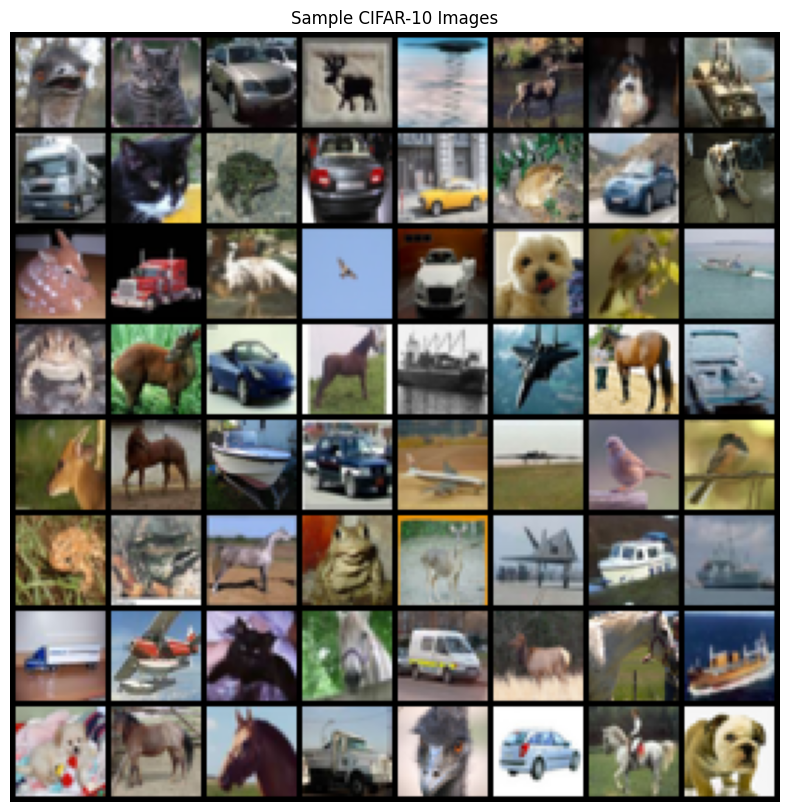

In [6]:
# Data transforms - normalize to [0, 1] for BCE loss
transform = transforms.Compose([
    transforms.ToTensor(),  # Converts to [0, 1]
])

# Dataset and DataLoader
train_dataset = datasets.CIFAR10(root="input/data", train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root="input/data", train=False, download=True, transform=transform)

train_loader = data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"Training samples: {len(train_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# Visualize some samples
sample_batch = next(iter(train_loader))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("Sample CIFAR-10 Images")
plt.imshow(np.transpose(vutils.make_grid(sample_batch[0][:64], padding=2, normalize=True, nrow=8), (1, 2, 0)))
plt.show()

## 5. Training the VAE

Now let's train the VAE!

Starting training...
Epochs: 50, Batch size: 128, Learning rate: 0.001
Beta (KL weight): 1.0
Epoch [1/50] Batch [0/391] Loss: 2372.6245 Recon: 2355.1257 KL: 17.4988
Epoch [1/50] Batch [100/391] Loss: 1881.0154 Recon: 1843.1932 KL: 37.8222
Epoch [1/50] Batch [200/391] Loss: 1836.6652 Recon: 1800.2883 KL: 36.3769
Epoch [1/50] Batch [300/391] Loss: 1824.9105 Recon: 1790.9862 KL: 33.9244

=== Epoch [1/50] ===
Average Loss: 1887.7551
Reconstruction: 1850.8814
KL Divergence: 36.8737

Epoch [2/50] Batch [0/391] Loss: 1821.2594 Recon: 1784.4255 KL: 36.8338
Epoch [2/50] Batch [100/391] Loss: 1817.5836 Recon: 1779.5367 KL: 38.0469
Epoch [2/50] Batch [200/391] Loss: 1866.2883 Recon: 1827.9357 KL: 38.3526
Epoch [2/50] Batch [300/391] Loss: 1840.1204 Recon: 1797.7502 KL: 42.3701

=== Epoch [2/50] ===
Average Loss: 1837.6872
Reconstruction: 1798.0523
KL Divergence: 39.6349

Epoch [3/50] Batch [0/391] Loss: 1881.7279 Recon: 1839.5566 KL: 42.1712
Epoch [3/50] Batch [100/391] Loss: 1817.6393 Recon: 177

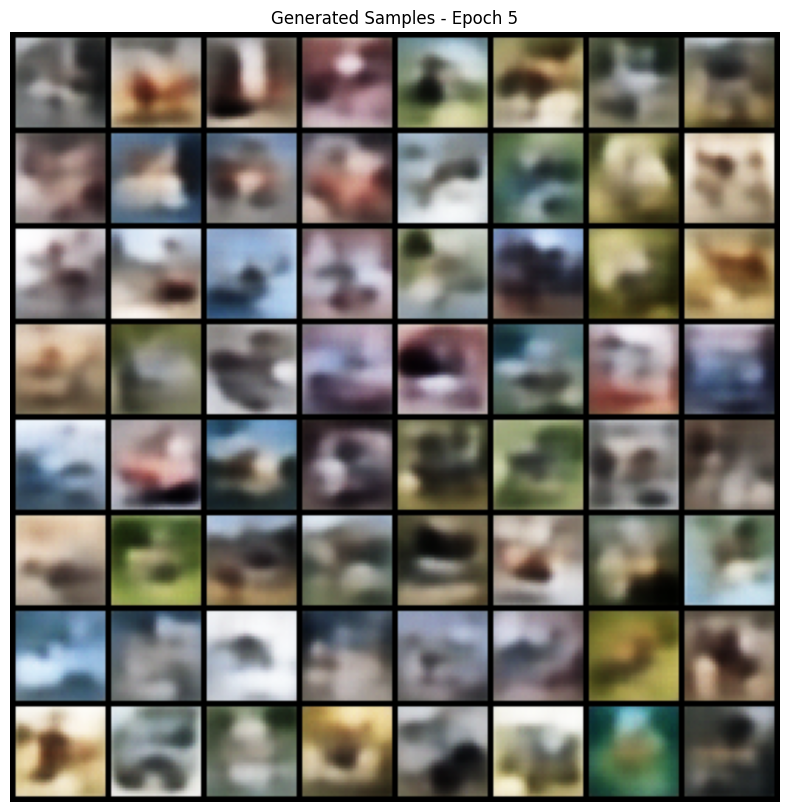

Epoch [6/50] Batch [0/391] Loss: 1818.0660 Recon: 1772.7253 KL: 45.3407
Epoch [6/50] Batch [100/391] Loss: 1821.5330 Recon: 1780.9685 KL: 40.5645
Epoch [6/50] Batch [200/391] Loss: 1820.9550 Recon: 1775.2103 KL: 45.7446
Epoch [6/50] Batch [300/391] Loss: 1827.9802 Recon: 1788.2922 KL: 39.6879

=== Epoch [6/50] ===
Average Loss: 1824.3343
Reconstruction: 1781.1615
KL Divergence: 43.1729

Epoch [7/50] Batch [0/391] Loss: 1802.7380 Recon: 1760.2727 KL: 42.4654
Epoch [7/50] Batch [100/391] Loss: 1814.5873 Recon: 1772.5386 KL: 42.0487
Epoch [7/50] Batch [200/391] Loss: 1827.3915 Recon: 1783.9464 KL: 43.4451
Epoch [7/50] Batch [300/391] Loss: 1847.9893 Recon: 1799.9956 KL: 47.9936

=== Epoch [7/50] ===
Average Loss: 1823.5363
Reconstruction: 1780.0890
KL Divergence: 43.4473

Epoch [8/50] Batch [0/391] Loss: 1802.0842 Recon: 1756.6995 KL: 45.3848
Epoch [8/50] Batch [100/391] Loss: 1813.4186 Recon: 1768.4098 KL: 45.0088
Epoch [8/50] Batch [200/391] Loss: 1810.8048 Recon: 1763.3311 KL: 47.4737


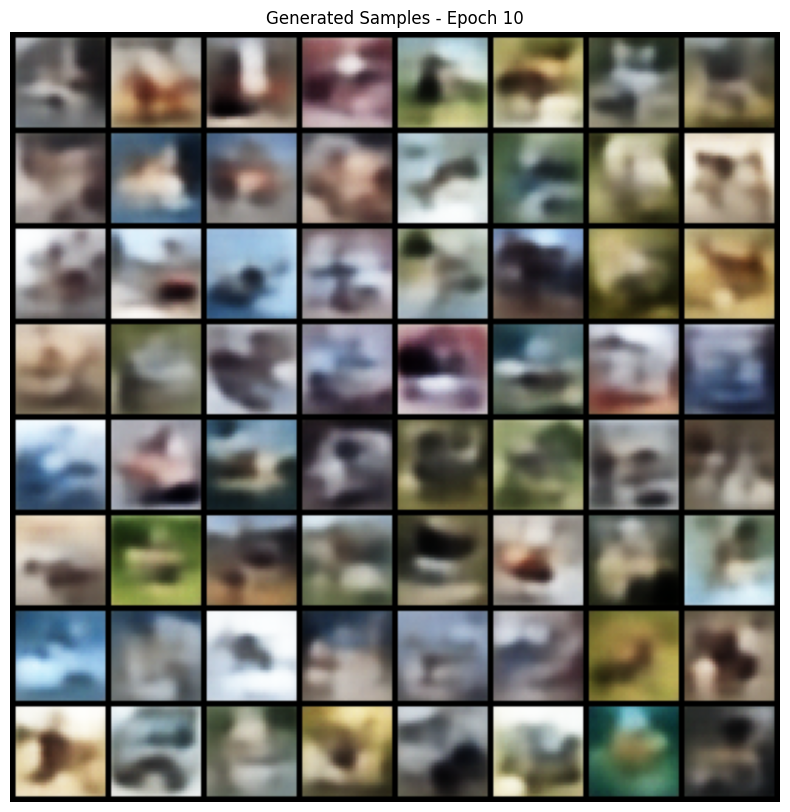

Epoch [11/50] Batch [0/391] Loss: 1878.6489 Recon: 1831.9797 KL: 46.6692
Epoch [11/50] Batch [100/391] Loss: 1817.7245 Recon: 1771.8419 KL: 45.8826
Epoch [11/50] Batch [200/391] Loss: 1824.9717 Recon: 1776.2019 KL: 48.7697
Epoch [11/50] Batch [300/391] Loss: 1808.7168 Recon: 1765.1194 KL: 43.5975

=== Epoch [11/50] ===
Average Loss: 1821.1612
Reconstruction: 1776.9491
KL Divergence: 44.2121

Epoch [12/50] Batch [0/391] Loss: 1789.5762 Recon: 1746.9386 KL: 42.6376
Epoch [12/50] Batch [100/391] Loss: 1840.4232 Recon: 1794.6089 KL: 45.8144
Epoch [12/50] Batch [200/391] Loss: 1832.2261 Recon: 1784.3607 KL: 47.8654
Epoch [12/50] Batch [300/391] Loss: 1799.7430 Recon: 1752.3369 KL: 47.4061

=== Epoch [12/50] ===
Average Loss: 1820.4469
Reconstruction: 1776.0814
KL Divergence: 44.3655

Epoch [13/50] Batch [0/391] Loss: 1860.4784 Recon: 1816.2538 KL: 44.2246
Epoch [13/50] Batch [100/391] Loss: 1814.7589 Recon: 1771.9819 KL: 42.7769
Epoch [13/50] Batch [200/391] Loss: 1820.5132 Recon: 1773.1749

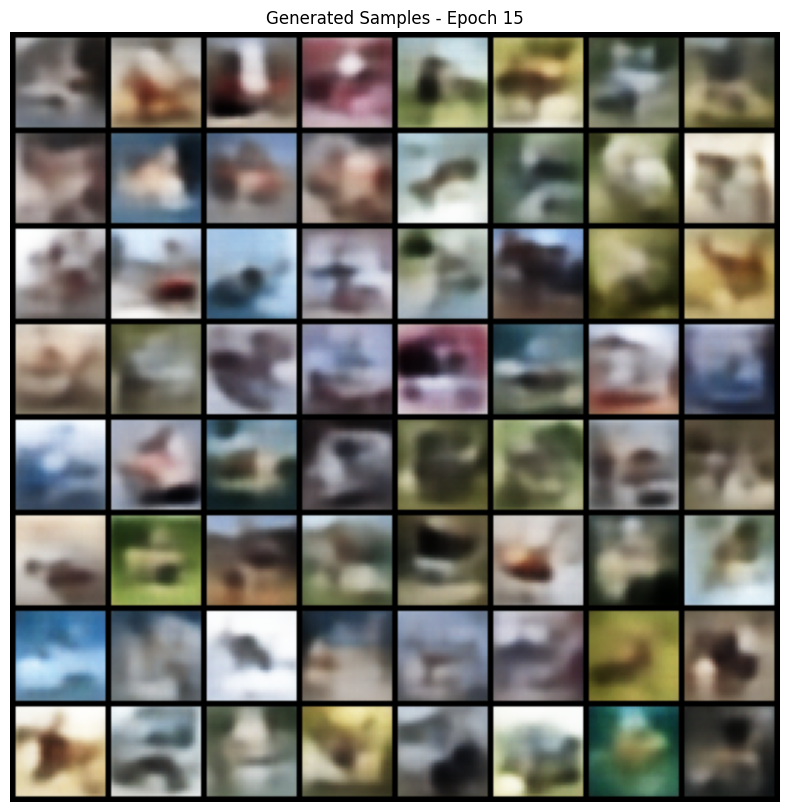

Epoch [16/50] Batch [0/391] Loss: 1819.6796 Recon: 1777.3955 KL: 42.2840
Epoch [16/50] Batch [100/391] Loss: 1830.7242 Recon: 1786.1421 KL: 44.5822
Epoch [16/50] Batch [200/391] Loss: 1811.3005 Recon: 1767.8420 KL: 43.4584
Epoch [16/50] Batch [300/391] Loss: 1811.5074 Recon: 1768.2727 KL: 43.2347

=== Epoch [16/50] ===
Average Loss: 1819.3198
Reconstruction: 1774.5036
KL Divergence: 44.8163

Epoch [17/50] Batch [0/391] Loss: 1834.6356 Recon: 1789.8011 KL: 44.8345
Epoch [17/50] Batch [100/391] Loss: 1783.5472 Recon: 1740.0524 KL: 43.4948
Epoch [17/50] Batch [200/391] Loss: 1809.9679 Recon: 1764.1724 KL: 45.7955
Epoch [17/50] Batch [300/391] Loss: 1794.2640 Recon: 1750.0652 KL: 44.1989

=== Epoch [17/50] ===
Average Loss: 1819.0967
Reconstruction: 1774.1932
KL Divergence: 44.9035

Epoch [18/50] Batch [0/391] Loss: 1809.4847 Recon: 1763.3392 KL: 46.1455
Epoch [18/50] Batch [100/391] Loss: 1793.9265 Recon: 1749.6475 KL: 44.2790
Epoch [18/50] Batch [200/391] Loss: 1798.8953 Recon: 1752.2595

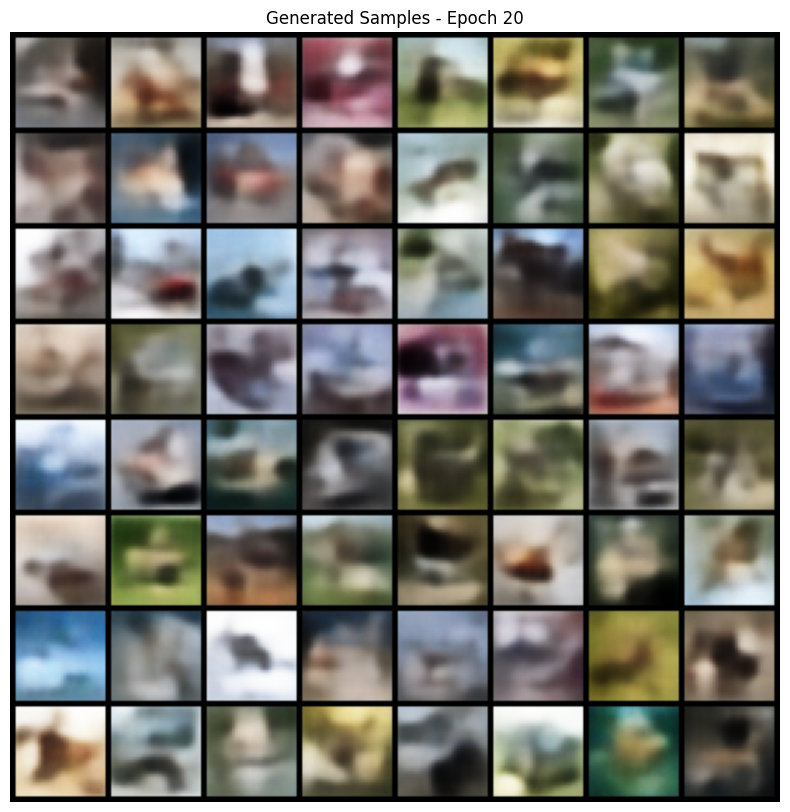

Epoch [21/50] Batch [0/391] Loss: 1812.0709 Recon: 1766.4785 KL: 45.5924
Epoch [21/50] Batch [100/391] Loss: 1824.5000 Recon: 1781.8049 KL: 42.6950
Epoch [21/50] Batch [200/391] Loss: 1804.5134 Recon: 1759.9977 KL: 44.5158
Epoch [21/50] Batch [300/391] Loss: 1847.6871 Recon: 1803.8126 KL: 43.8745

=== Epoch [21/50] ===
Average Loss: 1818.0573
Reconstruction: 1772.9261
KL Divergence: 45.1312

Epoch [22/50] Batch [0/391] Loss: 1840.6071 Recon: 1795.8799 KL: 44.7272
Epoch [22/50] Batch [100/391] Loss: 1847.9084 Recon: 1802.6638 KL: 45.2447
Epoch [22/50] Batch [200/391] Loss: 1860.9259 Recon: 1814.0297 KL: 46.8962
Epoch [22/50] Batch [300/391] Loss: 1819.3732 Recon: 1774.6304 KL: 44.7428

=== Epoch [22/50] ===
Average Loss: 1817.7452
Reconstruction: 1772.6285
KL Divergence: 45.1167

Epoch [23/50] Batch [0/391] Loss: 1812.6157 Recon: 1767.3278 KL: 45.2880
Epoch [23/50] Batch [100/391] Loss: 1828.3406 Recon: 1780.2057 KL: 48.1349
Epoch [23/50] Batch [200/391] Loss: 1824.2704 Recon: 1781.0308

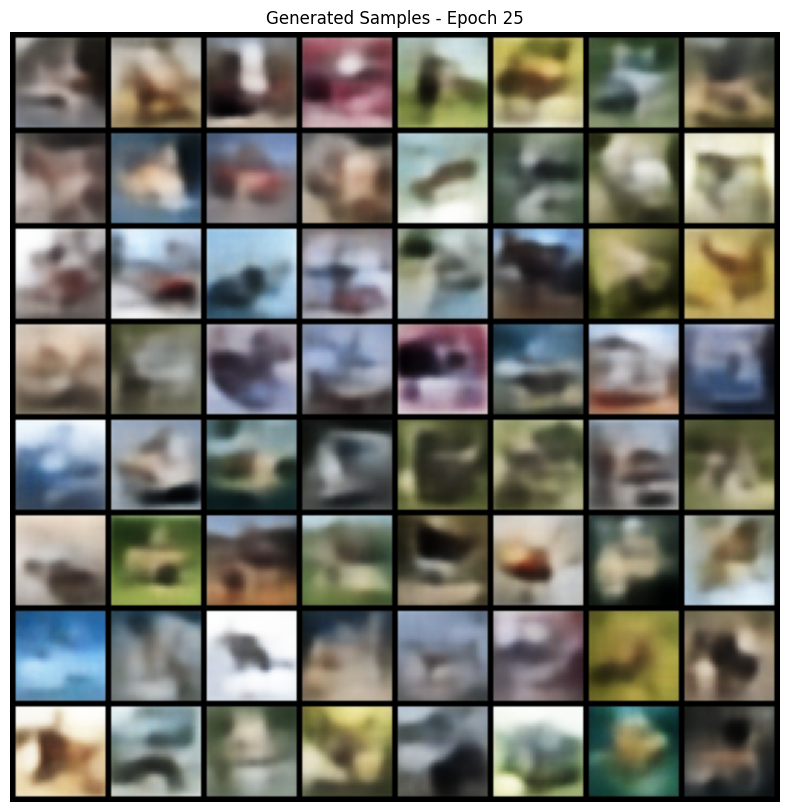

Epoch [26/50] Batch [0/391] Loss: 1808.2664 Recon: 1760.9023 KL: 47.3641
Epoch [26/50] Batch [100/391] Loss: 1830.5129 Recon: 1784.5574 KL: 45.9555
Epoch [26/50] Batch [200/391] Loss: 1838.1174 Recon: 1791.2828 KL: 46.8345
Epoch [26/50] Batch [300/391] Loss: 1817.7844 Recon: 1774.7676 KL: 43.0169

=== Epoch [26/50] ===
Average Loss: 1817.0910
Reconstruction: 1771.7893
KL Divergence: 45.3017

Epoch [27/50] Batch [0/391] Loss: 1817.0709 Recon: 1772.4659 KL: 44.6050
Epoch [27/50] Batch [100/391] Loss: 1817.8834 Recon: 1772.1316 KL: 45.7518
Epoch [27/50] Batch [200/391] Loss: 1806.8730 Recon: 1760.4017 KL: 46.4713
Epoch [27/50] Batch [300/391] Loss: 1801.5135 Recon: 1753.9170 KL: 47.5966

=== Epoch [27/50] ===
Average Loss: 1816.7397
Reconstruction: 1771.3906
KL Divergence: 45.3491

Epoch [28/50] Batch [0/391] Loss: 1809.3711 Recon: 1764.3281 KL: 45.0430
Epoch [28/50] Batch [100/391] Loss: 1831.4331 Recon: 1786.4288 KL: 45.0042
Epoch [28/50] Batch [200/391] Loss: 1785.1005 Recon: 1738.0144

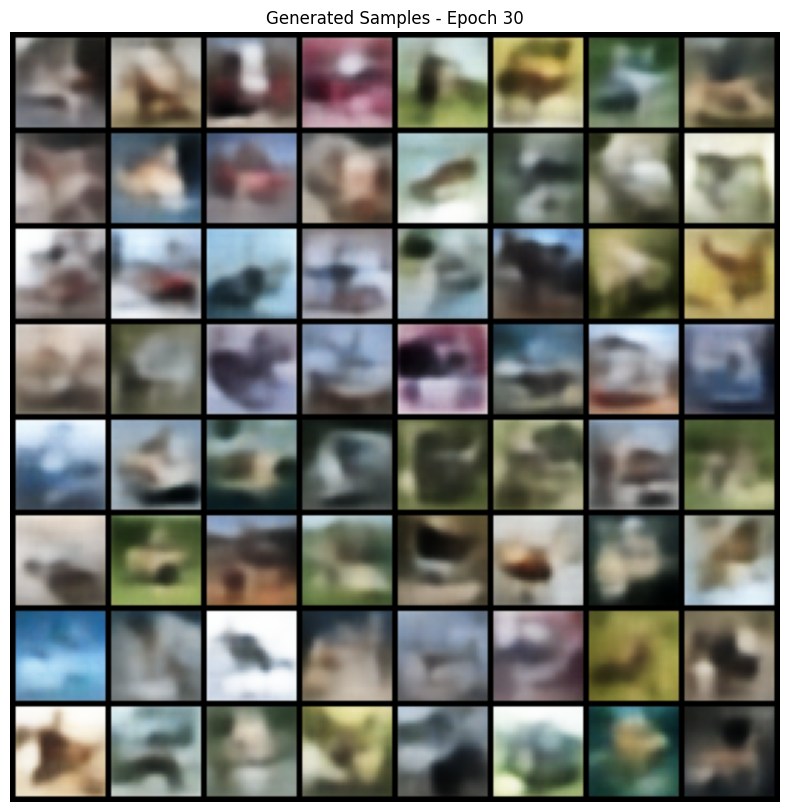

Epoch [31/50] Batch [0/391] Loss: 1821.9438 Recon: 1775.3575 KL: 46.5864
Epoch [31/50] Batch [100/391] Loss: 1782.0165 Recon: 1739.1316 KL: 42.8849
Epoch [31/50] Batch [200/391] Loss: 1812.2957 Recon: 1767.6763 KL: 44.6194
Epoch [31/50] Batch [300/391] Loss: 1793.9823 Recon: 1750.4019 KL: 43.5804

=== Epoch [31/50] ===
Average Loss: 1816.3156
Reconstruction: 1770.9069
KL Divergence: 45.4086

Epoch [32/50] Batch [0/391] Loss: 1849.6633 Recon: 1802.8889 KL: 46.7745
Epoch [32/50] Batch [100/391] Loss: 1826.2495 Recon: 1780.8235 KL: 45.4260
Epoch [32/50] Batch [200/391] Loss: 1781.3833 Recon: 1733.4641 KL: 47.9192
Epoch [32/50] Batch [300/391] Loss: 1833.2771 Recon: 1787.0060 KL: 46.2711

=== Epoch [32/50] ===
Average Loss: 1816.2300
Reconstruction: 1770.7591
KL Divergence: 45.4709

Epoch [33/50] Batch [0/391] Loss: 1834.4388 Recon: 1790.2778 KL: 44.1610
Epoch [33/50] Batch [100/391] Loss: 1809.3043 Recon: 1763.6165 KL: 45.6879
Epoch [33/50] Batch [200/391] Loss: 1816.5933 Recon: 1770.4430

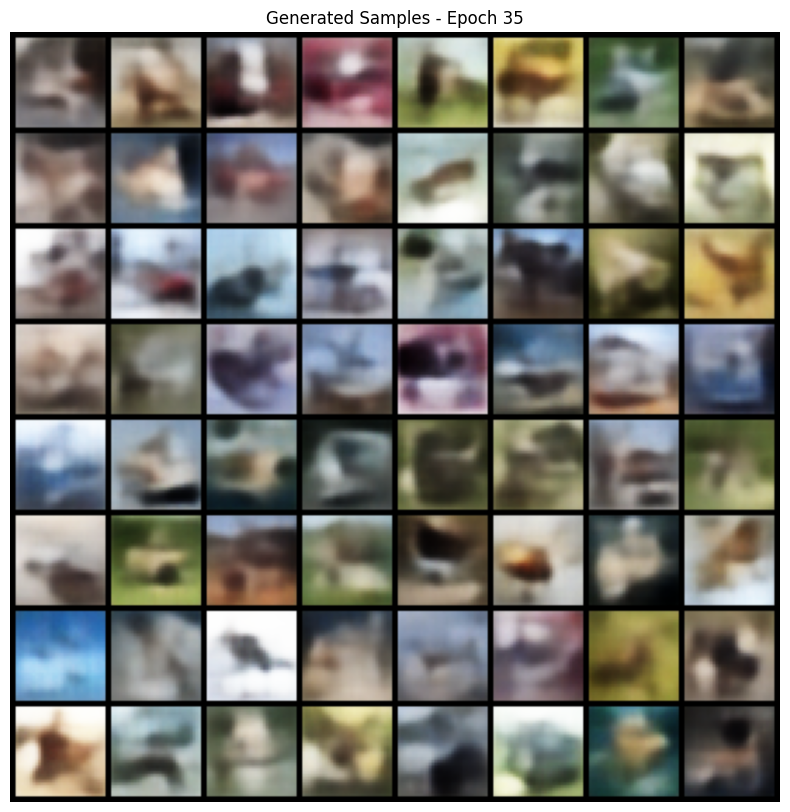

Epoch [36/50] Batch [0/391] Loss: 1823.6564 Recon: 1778.6035 KL: 45.0528
Epoch [36/50] Batch [100/391] Loss: 1787.4911 Recon: 1741.4790 KL: 46.0121
Epoch [36/50] Batch [200/391] Loss: 1831.0870 Recon: 1784.6946 KL: 46.3925
Epoch [36/50] Batch [300/391] Loss: 1828.2399 Recon: 1785.6368 KL: 42.6030

=== Epoch [36/50] ===
Average Loss: 1815.7998
Reconstruction: 1770.2646
KL Divergence: 45.5352

Epoch [37/50] Batch [0/391] Loss: 1816.2527 Recon: 1768.3506 KL: 47.9021
Epoch [37/50] Batch [100/391] Loss: 1808.8823 Recon: 1765.0098 KL: 43.8726
Epoch [37/50] Batch [200/391] Loss: 1818.1326 Recon: 1772.3888 KL: 45.7437
Epoch [37/50] Batch [300/391] Loss: 1837.0293 Recon: 1792.5127 KL: 44.5167

=== Epoch [37/50] ===
Average Loss: 1815.4717
Reconstruction: 1769.8562
KL Divergence: 45.6154

Epoch [38/50] Batch [0/391] Loss: 1814.2156 Recon: 1767.8403 KL: 46.3752
Epoch [38/50] Batch [100/391] Loss: 1791.8833 Recon: 1744.6829 KL: 47.2004
Epoch [38/50] Batch [200/391] Loss: 1817.0885 Recon: 1770.6589

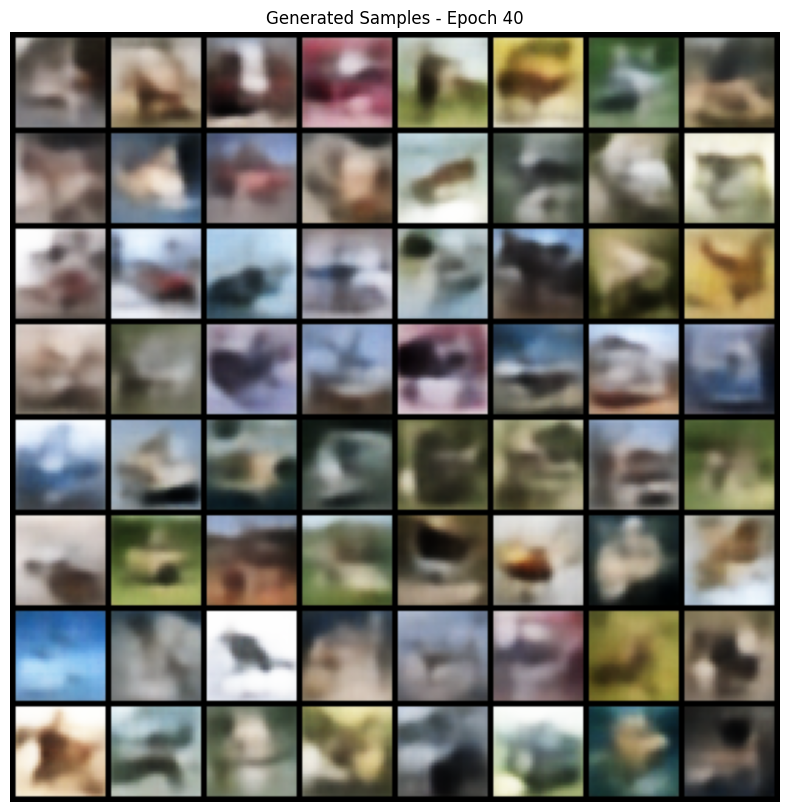

Epoch [41/50] Batch [0/391] Loss: 1751.7090 Recon: 1707.2809 KL: 44.4282
Epoch [41/50] Batch [100/391] Loss: 1802.7020 Recon: 1758.2568 KL: 44.4451
Epoch [41/50] Batch [200/391] Loss: 1815.0763 Recon: 1767.0515 KL: 48.0248
Epoch [41/50] Batch [300/391] Loss: 1799.6748 Recon: 1754.1409 KL: 45.5339

=== Epoch [41/50] ===
Average Loss: 1815.2415
Reconstruction: 1769.5672
KL Divergence: 45.6744

Epoch [42/50] Batch [0/391] Loss: 1830.4424 Recon: 1786.7317 KL: 43.7108
Epoch [42/50] Batch [100/391] Loss: 1815.5181 Recon: 1771.0673 KL: 44.4508
Epoch [42/50] Batch [200/391] Loss: 1826.6918 Recon: 1781.4746 KL: 45.2172
Epoch [42/50] Batch [300/391] Loss: 1813.7672 Recon: 1766.7671 KL: 47.0001

=== Epoch [42/50] ===
Average Loss: 1815.0297
Reconstruction: 1769.3325
KL Divergence: 45.6972

Epoch [43/50] Batch [0/391] Loss: 1819.0930 Recon: 1774.8672 KL: 44.2258
Epoch [43/50] Batch [100/391] Loss: 1811.3544 Recon: 1766.2397 KL: 45.1146
Epoch [43/50] Batch [200/391] Loss: 1837.2001 Recon: 1792.0664

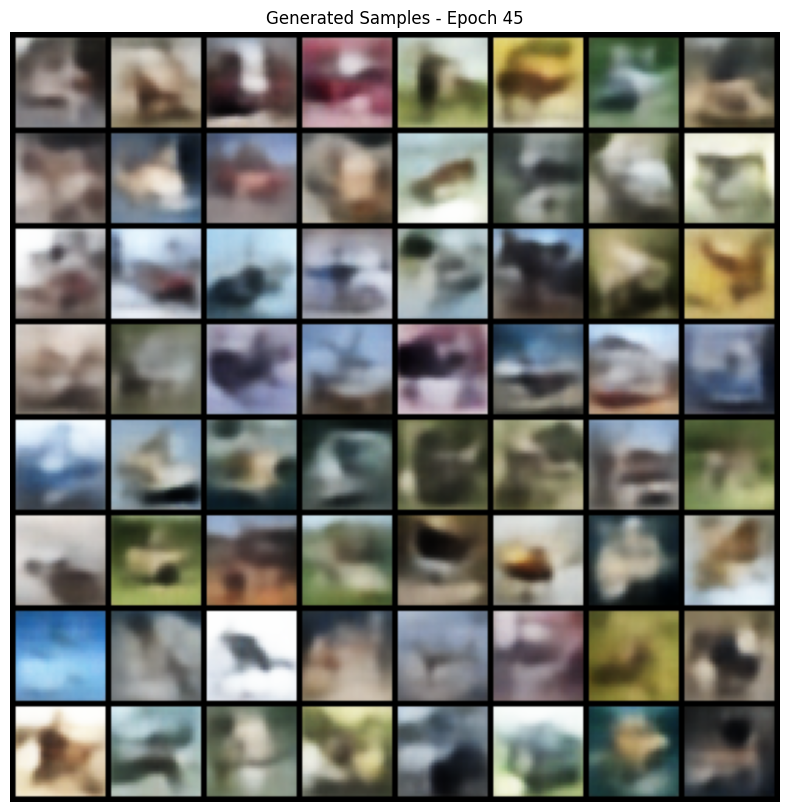

Epoch [46/50] Batch [0/391] Loss: 1807.0908 Recon: 1764.5134 KL: 42.5774
Epoch [46/50] Batch [100/391] Loss: 1788.5153 Recon: 1741.7263 KL: 46.7889
Epoch [46/50] Batch [200/391] Loss: 1820.3131 Recon: 1773.5889 KL: 46.7243
Epoch [46/50] Batch [300/391] Loss: 1849.6536 Recon: 1805.1362 KL: 44.5174

=== Epoch [46/50] ===
Average Loss: 1814.7617
Reconstruction: 1768.9829
KL Divergence: 45.7788

Epoch [47/50] Batch [0/391] Loss: 1814.3704 Recon: 1766.6774 KL: 47.6930
Epoch [47/50] Batch [100/391] Loss: 1825.1720 Recon: 1779.9749 KL: 45.1972
Epoch [47/50] Batch [200/391] Loss: 1797.4025 Recon: 1749.8977 KL: 47.5048
Epoch [47/50] Batch [300/391] Loss: 1812.7142 Recon: 1764.8424 KL: 47.8719

=== Epoch [47/50] ===
Average Loss: 1814.6657
Reconstruction: 1768.9020
KL Divergence: 45.7637

Epoch [48/50] Batch [0/391] Loss: 1824.3315 Recon: 1779.8296 KL: 44.5019
Epoch [48/50] Batch [100/391] Loss: 1838.6365 Recon: 1792.1777 KL: 46.4587
Epoch [48/50] Batch [200/391] Loss: 1821.1179 Recon: 1774.5348

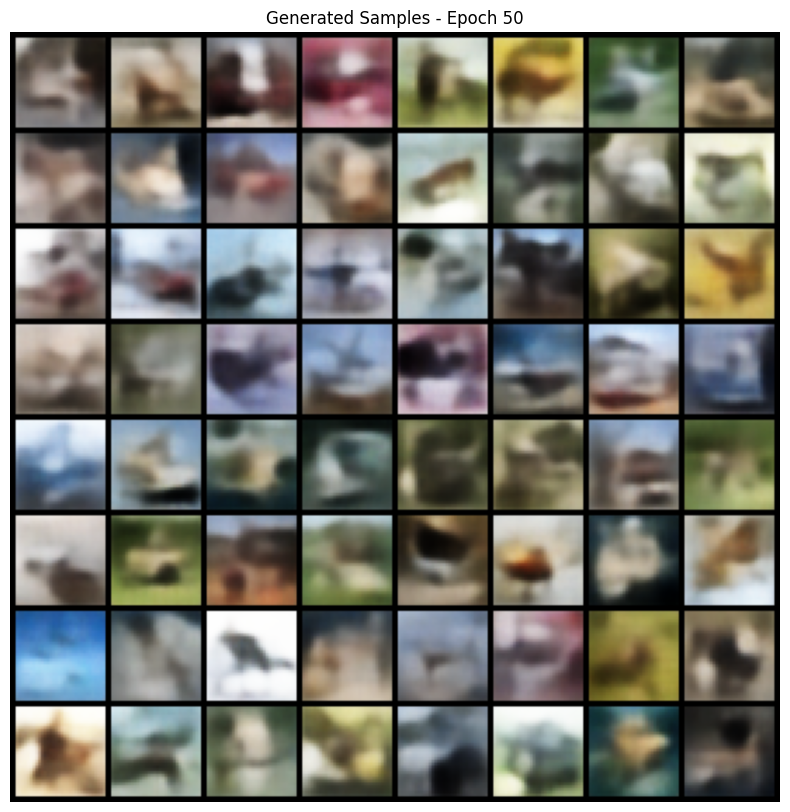

Training complete!


In [7]:
# Optimizer
optimizer = optim.Adam(vae.parameters(), lr=learning_rate)

# Training history
train_losses = []
recon_losses = []
kl_losses = []

# Fixed latent codes for visualization
fixed_z = torch.randn(64, latent_dim).to(device)

print("Starting training...")
print(f"Epochs: {num_epochs}, Batch size: {batch_size}, Learning rate: {learning_rate}")
print(f"Beta (KL weight): {beta}")
print("="*70)

for epoch in range(num_epochs):
    vae.train()
    train_loss = 0
    train_recon = 0
    train_kl = 0
    
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        
        # Forward pass
        optimizer.zero_grad()
        recon_batch, mu, logvar = vae(data)
        
        # Compute loss
        loss, recon_loss, kl_loss = vae_loss(recon_batch, data, mu, logvar, beta)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Accumulate losses
        train_loss += loss.item()
        train_recon += recon_loss.item()
        train_kl += kl_loss.item()
        
        if batch_idx % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}] Batch [{batch_idx}/{len(train_loader)}] '
                  f'Loss: {loss.item()/len(data):.4f} '
                  f'Recon: {recon_loss.item()/len(data):.4f} '
                  f'KL: {kl_loss.item()/len(data):.4f}')
    
    # Average losses for epoch
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon = train_recon / len(train_loader.dataset)
    avg_kl = train_kl / len(train_loader.dataset)
    
    train_losses.append(avg_loss)
    recon_losses.append(avg_recon)
    kl_losses.append(avg_kl)
    
    print(f'\n=== Epoch [{epoch+1}/{num_epochs}] ===')
    print(f'Average Loss: {avg_loss:.4f}')
    print(f'Reconstruction: {avg_recon:.4f}')
    print(f'KL Divergence: {avg_kl:.4f}')
    print("="*70 + "\n")
    
    # Generate samples every 5 epochs
    if (epoch + 1) % 5 == 0:
        vae.eval()
        with torch.no_grad():
            samples = vae.decoder(fixed_z)
            
            # Save samples
            plt.figure(figsize=(10, 10))
            plt.axis("off")
            plt.title(f"Generated Samples - Epoch {epoch+1}")
            plt.imshow(np.transpose(vutils.make_grid(samples.cpu(), padding=2, normalize=True, nrow=8), (1, 2, 0)))
            plt.savefig(f"outputs/vae/samples_epoch_{epoch+1}.png")
            plt.show()

print("Training complete!")

### 5.1 Visualize Training Progress

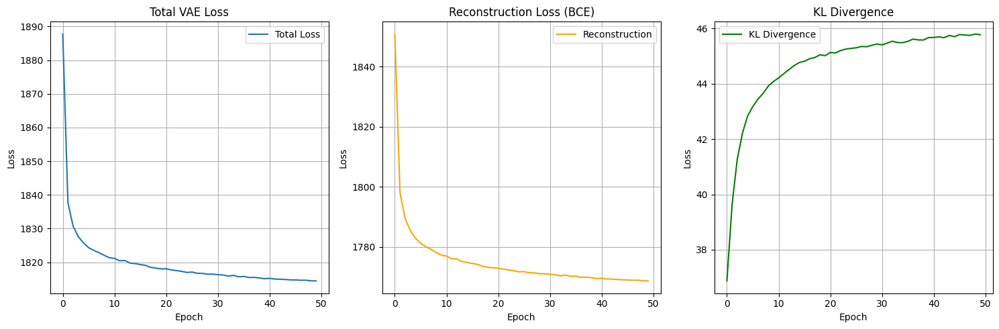

Training curves saved!


In [8]:
# Plot losses
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Total Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Total VAE Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(recon_losses, label='Reconstruction', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Reconstruction Loss (BCE)')
plt.legend()
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(kl_losses, label='KL Divergence', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('KL Divergence')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("outputs/vae/training_curves.png")
plt.show()

print("Training curves saved!")

## 6. Evaluation and Visualization

### 6.1 Image Reconstruction

Let's see how well the VAE reconstructs test images.

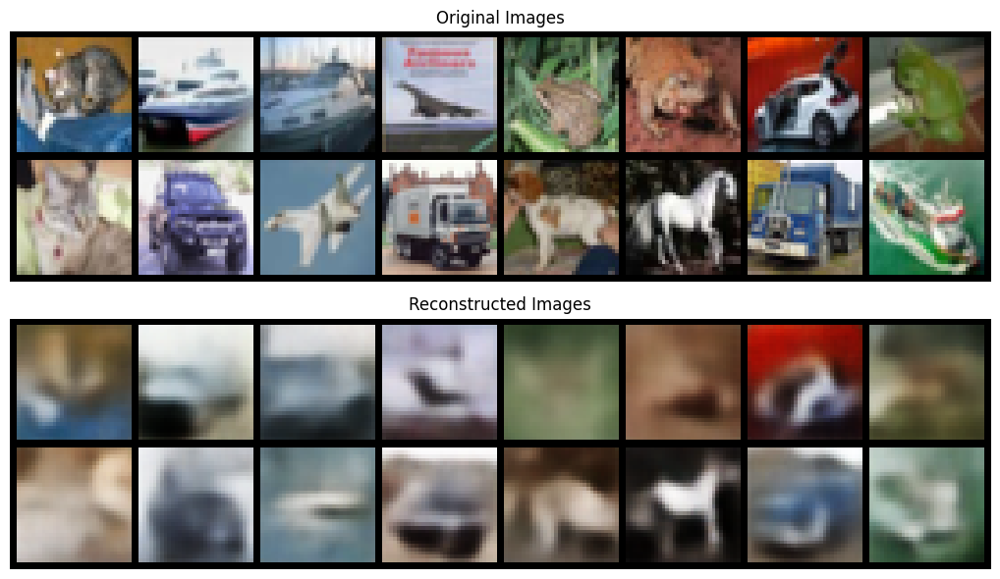

In [9]:
vae.eval()

# Get test batch
test_batch = next(iter(test_loader))
test_images = test_batch[0][:16].to(device)

# Reconstruct
with torch.no_grad():
    recon_images, mu, logvar = vae(test_images)

# Visualize original vs reconstructed
fig, axes = plt.subplots(2, 1, figsize=(15, 6))

# Original images
axes[0].imshow(np.transpose(vutils.make_grid(test_images.cpu(), padding=2, normalize=True, nrow=8), (1, 2, 0)))
axes[0].set_title("Original Images")
axes[0].axis('off')

# Reconstructed images
axes[1].imshow(np.transpose(vutils.make_grid(recon_images.cpu(), padding=2, normalize=True, nrow=8), (1, 2, 0)))
axes[1].set_title("Reconstructed Images")
axes[1].axis('off')

plt.tight_layout()
plt.savefig("outputs/vae/reconstruction.png")
plt.show()

### 6.2 Generate New Samples

Sample from the prior $p(z) = \mathcal{N}(0, I)$ and decode to generate new images.

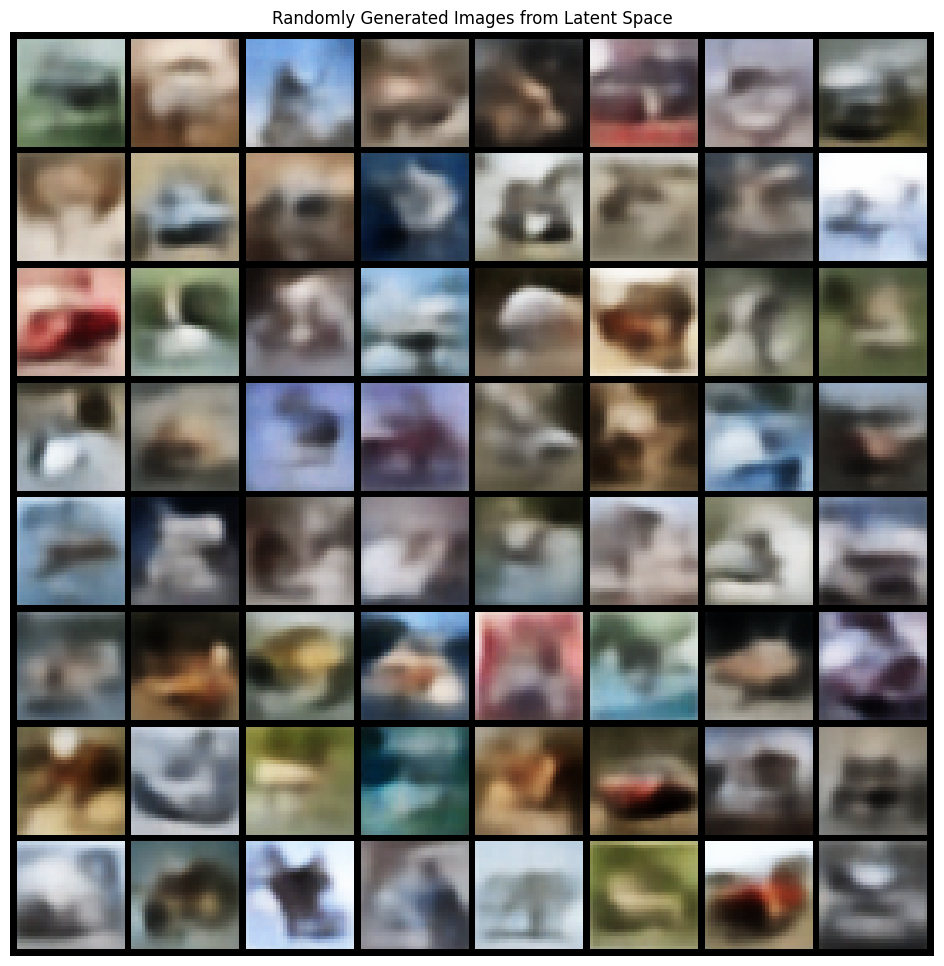

In [10]:
# Generate new samples
num_samples = 64
generated = vae.sample(num_samples, device)

plt.figure(figsize=(12, 12))
plt.axis("off")
plt.title("Randomly Generated Images from Latent Space")
plt.imshow(np.transpose(vutils.make_grid(generated.cpu(), padding=2, normalize=True, nrow=8), (1, 2, 0)))
plt.savefig("outputs/vae/generated_samples.png")
plt.show()

### 6.3 Latent Space Interpolation

One of the key advantages of VAEs is the **smooth, continuous latent space**. We can interpolate between two images in latent space.

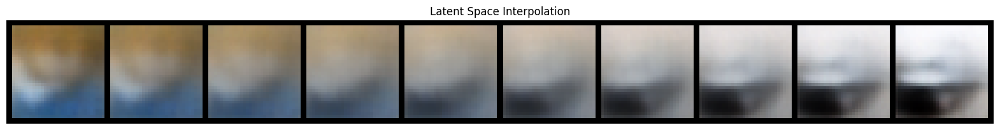

Notice how the interpolation is smooth - this shows the latent space is well-structured!


In [11]:
def interpolate_latent(vae, img1, img2, steps=10):
    """
    Interpolate between two images in latent space
    
    Args:
        vae: VAE model
        img1: First image (1, 3, 32, 32)
        img2: Second image (1, 3, 32, 32)
        steps: Number of interpolation steps
    
    Returns:
        Interpolated images
    """
    vae.eval()
    with torch.no_grad():
        # Encode both images
        mu1, logvar1 = vae.encoder(img1)
        mu2, logvar2 = vae.encoder(img2)
        
        # Use means (no randomness for interpolation)
        z1 = mu1
        z2 = mu2
        
        # Interpolate
        alphas = torch.linspace(0, 1, steps).to(device)
        interpolated = []
        
        for alpha in alphas:
            z_interp = (1 - alpha) * z1 + alpha * z2
            img_interp = vae.decoder(z_interp)
            interpolated.append(img_interp)
        
        return torch.cat(interpolated, dim=0)

# Get two test images
test_imgs = next(iter(test_loader))[0][:2].to(device)
img1 = test_imgs[0:1]
img2 = test_imgs[1:2]

# Interpolate
interpolated = interpolate_latent(vae, img1, img2, steps=10)

# Visualize
plt.figure(figsize=(20, 3))
plt.axis("off")
plt.title("Latent Space Interpolation")
plt.imshow(np.transpose(vutils.make_grid(interpolated.cpu(), padding=2, normalize=True, nrow=10), (1, 2, 0)))
plt.savefig("outputs/vae/interpolation.png")
plt.show()

print("Notice how the interpolation is smooth - this shows the latent space is well-structured!")

### 6.4 Latent Space Visualization (2D)

For visualization, let's train a small 2D VAE to see the latent space structure.

### 6.5 Latent Space Sampling Grid

For a 2D latent space, we can create a grid to see how different regions decode.

In [ ]:
def plot_latent_grid(vae, n=10, figsize=15):
    """
    Plot a grid of images sampled from a 2D latent space
    Only works for 2D latent dimension!
    """
    # Create grid of latent codes
    grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
    grid_y = norm.ppf(np.linspace(0.05, 0.95, n))
    
    figure = np.zeros((n * 32, n * 32, 3))
    
    vae.eval()
    with torch.no_grad():
        for i, yi in enumerate(grid_y):
            for j, xi in enumerate(grid_x):
                z_sample = torch.tensor([[xi, yi]], dtype=torch.float32).to(device)
                x_decoded = vae.decoder(z_sample)
                img = x_decoded[0].cpu().numpy().transpose(1, 2, 0)
                figure[i * 32: (i + 1) * 32, j * 32: (j + 1) * 32] = img
    
    plt.figure(figsize=(figsize, figsize))
    plt.imshow(figure, cmap='viridis')
    plt.title('Latent Space Sampling Grid (2D)')
    plt.axis('off')
    plt.savefig("outputs/vae/latent_grid.png")
    plt.show()

# Uncomment if you trained the 2D VAE above:
# plot_latent_grid(vae_2d, n=10)

print("Latent grid visualization requires 2D VAE (see previous cell)")

## 7. Advanced Topics and Variants

### 7.1 β-VAE (Beta-VAE)

**Motivation**: Standard VAE sometimes produces blurry images because the KL term is too strong.

**Solution**: Weight the KL divergence with a hyperparameter $\beta$:

$$\mathcal{L}_{\beta\text{-VAE}} = \text{Reconstruction Loss} + \beta \cdot D_{KL}(q(z|x) \| p(z))$$

- $\beta < 1$: Prioritize reconstruction (sharper images, less regularization)
- $\beta > 1$: Prioritize disentanglement (more interpretable latent factors)
- $\beta = 1$: Standard VAE

**Try it**: Change `beta=1.0` to `beta=0.5` or `beta=2.0` in the training loop!

### 7.2 Conditional VAE (CVAE)

Add class labels to control generation:

- Encoder: $q_\phi(z | x, y)$ where $y$ is the class label
- Decoder: $p_\theta(x | z, y)$

**Implementation**: Concatenate one-hot encoded labels to inputs.

### 7.3 Vector Quantized VAE (VQ-VAE)

Replace continuous latent space with discrete codes (like DALL-E).

### 7.4 Applications of VAEs

1. **Anomaly Detection**: Points far from the latent distribution are anomalies
2. **Data Augmentation**: Generate new training samples
3. **Denoising**: Reconstruct clean images from noisy inputs
4. **Compression**: Use latent codes for lossy compression
5. **Semi-supervised Learning**: Use VAE loss with labeled/unlabeled data

## 8. Exercises and Challenges

### Beginner
1. **Change β**: Retrain with `beta=0.5` and `beta=2.0`. Compare image quality and latent space structure.
2. **Latent Dimension**: Try `latent_dim=64` and `latent_dim=256`. How does it affect reconstruction?
3. **Activation Functions**: Replace ReLU with LeakyReLU in encoder. Does it help?

### Intermediate
4. **Conditional VAE**: Modify the code to condition on CIFAR-10 class labels. Generate class-specific images.
5. **Different Loss**: Replace BCE with MSE for reconstruction. How does it change results?
6. **Latent Arithmetic**: Find latent codes for specific image types and perform arithmetic (e.g., car + blue = blue car).

### Advanced
7. **Disentanglement Metrics**: Implement a metric to measure latent factor independence (e.g., SAP score).
8. **Hierarchical VAE**: Implement a VAE with multiple levels of latent variables.
9. **FID Score**: Compute Fréchet Inception Distance to quantitatively evaluate generation quality.
10. **Compare with GAN**: Train DCGAN and VAE on the same dataset. Compare:
    - Training stability
    - Image quality (use FID)
    - Interpolation smoothness
    - Mode coverage (does the model generate diverse samples?)

### Research Challenge
11. **Hybrid Model**: Combine VAE and GAN (VAE-GAN). Use VAE for structure, GAN discriminator for sharpness.

## 9. Summary and Key Takeaways

### What We Learned

✅ **Probabilistic Generative Modeling**: VAEs model data as samples from learned distributions

✅ **Mathematical Foundations**:
- ELBO: Evidence Lower Bound
- KL Divergence: Regularizes latent space to prior
- Reparameterization Trick: Enables backpropagation through sampling

✅ **Architecture**: Encoder-decoder with Gaussian latent variables

✅ **Loss Function**: Reconstruction + KL divergence

✅ **Advantages**:
- Stable training (compared to GANs)
- Well-structured latent space
- Probabilistic interpretation
- Good for interpolation and exploration

✅ **Disadvantages**:
- Blurrier images than GANs
- Reconstruction bias (prioritizes pixel-wise accuracy over perceptual quality)

### Comparison: VAE vs DCGAN

| Metric | VAE | DCGAN |
|--------|-----|-------|
| Training Stability | ⭐⭐⭐⭐⭐ | ⭐⭐⭐ |
| Image Sharpness | ⭐⭐⭐ | ⭐⭐⭐⭐⭐ |
| Latent Space Structure | ⭐⭐⭐⭐⭐ | ⭐⭐⭐ |
| Mode Coverage | ⭐⭐⭐⭐ | ⭐⭐⭐ |
| Interpretability | ⭐⭐⭐⭐ | ⭐⭐ |

### Next Steps

1. **Read Papers**:
   - [Auto-Encoding Variational Bayes](https://arxiv.org/abs/1312.6114) (Kingma & Welling, 2013)
   - [β-VAE](https://openreview.net/forum?id=Sy2fzU9gl) (Higgins et al., 2017)
   - [VQ-VAE](https://arxiv.org/abs/1711.00937) (van den Oord et al., 2017)

2. **Try Different Datasets**:
   - CelebA (faces)
   - MNIST (simpler, good for debugging)
   - Custom datasets

3. **Explore Variants**:
   - Conditional VAE (CVAE)
   - Vector Quantized VAE (VQ-VAE)
   - Adversarial Autoencoder (AAE)

4. **Applications**:
   - Anomaly detection in medical imaging
   - Music generation
   - Molecule design

### Resources

- **PyTorch VAE Examples**: [github.com/pytorch/examples](https://github.com/pytorch/examples/tree/main/vae)
- **Tutorial**: [Tutorial on Variational Autoencoders](https://arxiv.org/abs/1606.05908)
- **Blog**: [Understanding VAEs](https://towardsdatascience.com/understanding-variational-autoencoders-vaes-f70510919f73)

Congratulations! You've mastered Variational Autoencoders! 🎉

## 10. Save Model

In [ ]:
# Save the trained model
torch.save(vae.state_dict(), "outputs/vae/vae_cifar10.pth")
print("Model saved to outputs/vae/vae_cifar10.pth")

# To load later:
# vae_loaded = VAE(latent_dim, nc).to(device)
# vae_loaded.load_state_dict(torch.load("outputs/vae/vae_cifar10.pth"))
# vae_loaded.eval()